In [1]:
#@save
import collections
import hashlib
import inspect
import math
import os
import random
import re
import shutil
import sys
import tarfile
import time
import zipfile
from collections import defaultdict
import pandas as pd
import requests
from IPython import display
from torch.cuda.amp import autocast, GradScaler
from matplotlib import pyplot as plt
from matplotlib_inline import backend_inline
from torch.nn import functional as F
d2l = sys.modules[__name__]

<h1>Intro</h1>

In [2]:
import torch
from torch import nn
from torchsummary import summary
import numpy as np

In [3]:
def add_to_class(Class): #@save
    def wrapper(obj):
        setattr(Class, obj.__name__, obj)
    return wrapper

In [4]:
def cpu(): #@save
    return torch.device('cpu')
def gpu(i=0): #@save
    return torch.device(f'cuda:{i}')
cpu(), gpu(), gpu(1)

(device(type='cpu'),
 device(type='cuda', index=0),
 device(type='cuda', index=1))

In [5]:
def num_gpus(): #@save
    return torch.cuda.device_count()
num_gpus()

1

In [6]:
def try_gpu(i=0): #@save
    """Return gpu(i) if exists, otherwise return cpu()."""
    if num_gpus() >= i + 1:
        return gpu(i)
    return cpu()

In [7]:
class HyperParameters: #@save
    def save_hyperparameters(self, ignore=[]):
        raise NotImplemented

In [8]:
@d2l.add_to_class(d2l.HyperParameters) #@save
def save_hyperparameters(self, ignore=[]):
    """Save function arguments into class attributes."""
    
    #f_back: frame caller
    #frame: table of local variablies to the frame's function
    frame = inspect.currentframe().f_back
    _, _, _, local_vars = inspect.getargvalues(frame)
    #Pega as variáveis locais da função que chamou esta.
    
    self.hparams = {k:v for k, v in local_vars.items()
        if k not in set(ignore+['self']) and not k.startswith('_')}
    for k, v in self.hparams.items():
        setattr(self, k, v)

In [9]:
class ProgressBoard(d2l.HyperParameters): #@save
    """Plot data points in animation."""
    def __init__(self, xlabel=None, ylabel=None, xlim=None,
            ylim=None, xscale='linear', yscale='linear',
            ls=['-', '--', '-.', ':'], colors=['C0', 'C1', 'C2', 'C3'],
            fig=None, axes=None, figsize=(3.5, 2.5), display=True):
        self.save_hyperparameters()
    def draw(self, x, y, label, every_n=1):
        raise NotImplemented

In [10]:
def use_svg_display(): #@save
    """Use the svg format to display a plot in Jupyter."""
    backend_inline.set_matplotlib_formats('svg')

In [11]:
def set_figsize(figsize=(3.5, 2.5)): #@save
    """Set the figure size for matplotlib."""
    use_svg_display()
    d2l.plt.rcParams['figure.figsize'] = figsize

In [12]:
@d2l.add_to_class(d2l.ProgressBoard) #@save
def draw(self, x, y, label, every_n=1):
    Point = collections.namedtuple('Point', ['x', 'y'])
    if not hasattr(self, 'raw_points'):
        self.raw_points = collections.OrderedDict()
        self.data = collections.OrderedDict()
    if label not in self.raw_points:
        self.raw_points[label] = []
        self.data[label] = []
    points = self.raw_points[label]
    line = self.data[label]
    points.append(Point(x, y))
    if len(points) != every_n:
        return
    mean = lambda x: sum(x) / len(x)
    line.append(Point(mean([p.x for p in points]),
                        mean([p.y for p in points])))
    points.clear()
    if not self.display:
        return
    d2l.use_svg_display()
    if self.fig is None:
        self.fig = d2l.plt.figure(figsize=self.figsize)
    plt_lines, labels = [], []
    for (k, v), ls, color in zip(self.data.items(), self.ls, self.colors):
        plt_lines.append(d2l.plt.plot([p.x for p in v], [p.y for p in v],
                            linestyle=ls, color=color)[0])
        labels.append(k)
    axes = self.axes if self.axes else d2l.plt.gca()
    if self.xlim: axes.set_xlim(self.xlim)
    if self.ylim: axes.set_ylim(self.ylim)
    if not self.xlabel: self.xlabel = self.x
    axes.set_xlabel(self.xlabel)
    axes.set_ylabel(self.ylabel)
    axes.set_xscale(self.xscale)
    axes.set_yscale(self.yscale)
    axes.legend(plt_lines, labels)
    display.display(self.fig)
    display.clear_output(wait=True)

<h3>Model</h3>

In [13]:
class Module(nn.Module, d2l.HyperParameters): #@save
    def __init__(self, plot_train_per_epoch=2, plot_valid_per_epoch=1):
        super().__init__()
        self.save_hyperparameters()
        self.board = ProgressBoard()
        
    def loss(self, y_hat, y):
        raise NotImplementedError
        
    def forward(self, X):
        assert hasattr(self, 'net'), 'Neural network is defined'
        return self.net(X)
    
    def plot(self, key, value, train):
        """Plot a point in animation."""
        assert hasattr(self, 'trainer'), 'Trainer is not inited'
        self.board.xlabel = 'epoch'
        if train:
            x = self.trainer.train_batch_idx / \
                self.trainer.num_train_batches
            n = self.trainer.num_train_batches / \
                self.plot_train_per_epoch
            #print('Train loss: ', x)
        else:
            x = self.trainer.epoch + 1
            n = self.trainer.num_val_batches / \
                self.plot_valid_per_epoch
        self.board.draw(x, value.to(device=cpu()).detach().numpy(),
        ('train_' if train else 'val_') + key,
        every_n=int(n))
        
    def training_step(self, batch):
        l = self.loss(self(*batch[:-1]), batch[-1])
        self.plot('loss', l, train=True)
        return l
    
    def validation_step(self, batch):
        l = self.loss(self(*batch[:-1]), batch[-1])
        self.plot('loss', l, train=False)
        return l
        
    def configure_optimizers(self, weight_decay=1e-4):
        return torch.optim.AdamW(self.parameters(), lr=self.lr, amsgrad=True, weight_decay=weight_decay)
        
        #return torch.optim.RMSprop(self.parameters(), lr=self.lr, weight_decay=weight_decay)
        
    def apply_init(self, inputs, init=None):
        self.forward(*inputs)
        if init is not None:
            self.net.apply(init)

<h3>Data Module</h3>

In [14]:
class DataModule(d2l.HyperParameters): #@save
    def __init__(self, root='../data', num_workers=4):
        self.save_hyperparameters()
        
    def get_dataloader(self, train):
        raise NotImplementedError
        
    def train_dataloader(self):
        return self.get_dataloader(train=True)
    
    def val_dataloader(self):
        return self.get_dataloader(train=False)

<h3>Trainer</h3>

In [15]:
class Trainer(d2l.HyperParameters): #@save
    def __init__(self, max_epochs, num_gpus=0, gradient_clip_val=0):
        self.save_hyperparameters()
        assert num_gpus == 0, 'No GPU support yet'
        
    def prepare_batch(self, batch):
        return batch
        
    def prepare_data(self, data):
        self.train_dataloader = data.train_dataloader()
        self.val_dataloader = data.val_dataloader()
        self.num_train_batches = len(self.train_dataloader)
        self.num_val_batches = (len(self.val_dataloader)
                                if self.val_dataloader is not None else 0)
    def prepare_model(self, model):
        model.trainer = self
        model.board.xlim = [0, self.max_epochs]
        self.model = model
        
        
    
    def fit(self, model, data, lr_update=0.8, lr_reduct_rule=-1, lr_limit = 0.01, lr_uu = 2, weight_decay=0.001, warmup=0):
        self.prepare_data(data)
        self.prepare_model(model)
        self.optim = model.configure_optimizers(weight_decay)
        self.epoch = 0
        self.train_batch_idx = 0
        self.val_batch_idx = 0
        
        self.ema_start = self.max_epochs//4
        self.ema_model = None
        
        self.warmup = warmup
        
        self.sched = None
        
        
        #sched1 = torch.optim.lr_scheduler.LinearLR(self.optim, start_factor=self.model.lr/self.warmup, total_iters=self.warmup)
        #sched2=torch.torch.optim.lr_scheduler.CosineAnnealingLR(self.optim, T_max=self.max_epochs-self.warmup,
        #                                                        eta_min=self.model.lr/self.max_epochs)
        #lmbda = lambda x: 1e-6
        #sched2 = torch.optim.lr_scheduler.MultiplicativeLR(self.optim, lr_lambda=lmbda)
        #sched2 = torch.torch.optim.lr_scheduler.CosineAnnealingLR(self.optim, T_max=self.max_epochs, eta_min=self.model.lr/30)
        
        self.sched = torch.optim.lr_scheduler.OneCycleLR(self.optim, self.model.lr, epochs=self.max_epochs-self.warmup, 
                                                                 steps_per_epoch=len(self.train_dataloader))
        
        #self.sched = torch.optim.lr_scheduler.SequentialLR(self.optim, [sched1, sched2],
        #                                                   milestones=[self.warmup])
        
        
        
        #self.sched = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(self.optim, T_0=1, T_mult=2,
        #                                                                  eta_min = self.model.lr/30)
        
        #lmbda = lambda epoch:1.5
        #sched1=torch.optim.lr_scheduler.MultiplicativeLR(self.optim, lr_lambda=lmbda)
        

        
        
        
        last_loss = 1
        last_losses = []
        
        lr_copy = self.model.lr
        highest_acc = 0
        for self.epoch in range(self.max_epochs):
            val_loss, acc, loss = self.fit_epoch()
            
            if acc>highest_acc:
                highest_acc = acc
            
            actual_loss = loss
            
            last_losses.append(actual_loss)
            
            """
            if((last_loss-actual_loss)>0 and (last_losses[0]-actual_loss)>0):
                if ((((last_loss-actual_loss)/(last_losses[0]-actual_loss))) < lr_reduct_rule):  
                    if self.model.lr*lr_update >= lr_limit:
                        self.model.lr*=lr_update
                        for g in self.optim.param_groups:
                            g['lr'] = g['lr']*lr_update
                            #g['weight_decay'] = 100*g['lr']
                        #self.model.lr = self.model.lr*lr_update
                        
                        #lr_copy = lr_copy*lr_update
                        #self.sched=torch.torch.optim.lr_scheduler.CosineAnnealingLR(self.optim, T_max=3, eta_min=lr_copy)
                        
                        weight_decay = weight_decay*lr_update
                        #self.optim.lr = self.optim.lr*lr_update
                        #self.optim.weight_decay = weight_decay
                        self.optim = model.configure_optimizers(weight_decay)
                        counter = 0
                        last_losses = []
                        last_losses.append(actual_loss)
                        if lr_update<0.5:
                            lr_update*=lr_uu
            """                
                
            
            for g in self.optim.param_groups:
                g['weight_decay'] = g['lr']*1.56
            print('Accuracy:', acc)
            print('Learning rate:', self.optim.param_groups[0]['lr'])
            
            last_loss = actual_loss
        #torch.optim.swa_utils.update_bn(data, self.ema_model)
        print('Loss:', loss)
        print("Val loss, acc:", val_loss, acc)
        print('Lr:', lr_copy)
        print(f'Highest acc: {highest_acc}')
        
    def fit_epoch(self):
        #Barckward
        self.model.train()
        all_losses = 0
        count = 0
        
        for batch in self.train_dataloader:
            with autocast():
                loss = self.model.training_step(self.prepare_batch(batch))
            all_losses+=torch.clone(loss).detach()
            count+=1
            for param in model.parameters():
                param.grad = None
            with torch.no_grad():
                loss.backward()
                if self.gradient_clip_val > 0:
                    #self.clip_gradients(self.gradient_clip_val, self.model)
                    torch.nn.utils.clip_grad_norm_(self.model.parameters(), self.gradient_clip_val)
                self.optim.step()
            if self.sched: self.sched.step()
            if self.train_batch_idx == self.ema_start and self.ema_model==None:
                ema_avg = (lambda averaged_model_parameter, model_parameter, num_averaged:0.1 * averaged_model_parameter + 0.9 * model_parameter)
                self.ema_model = torch.optim.swa_utils.AveragedModel(self.model, avg_fn=ema_avg)
            if self.train_batch_idx>self.ema_start:
                self.ema_model.update_parameters(self.model)
            self.train_batch_idx += 1
            count+=1
        
        
        
        if self.val_dataloader is None:
            return
        self.model.eval()
        
        all_losses/=count
        
        acc = 0
        val_loss = 0
        count = 0
        for batch in self.val_dataloader:
            with torch.no_grad():
                final_val_error = self.model.validation_step(self.prepare_batch(batch))
                val_loss += final_val_error[0]
                acc += final_val_error[1]
            count += 1
            self.val_batch_idx += 1
        val_loss/=count
        acc/=count
        
        
        return val_loss, acc, all_losses

In [16]:
@d2l.add_to_class(d2l.Trainer) #@save
def __init__(self, max_epochs, num_gpus=0, gradient_clip_val=0):
    self.save_hyperparameters()
    self.gpus = [d2l.gpu(i) for i in range(min(num_gpus, d2l.num_gpus()))]

@d2l.add_to_class(d2l.Trainer) #@save
def prepare_batch(self, batch):
    if self.gpus:
        batch = [a.to(self.gpus[0]) for a in batch]
    return batch

@d2l.add_to_class(d2l.Trainer) #@save
def prepare_model(self, model):
    model.trainer = self
    model.board.xlim = [0, self.max_epochs]
    if self.gpus:
        model.to(self.gpus[0])
    self.model = model

@d2l.add_to_class(d2l.Trainer) #@save
def clip_gradients(self, grad_clip_val, model):
    params = [p for p in model.parameters() if p.requires_grad]
    norm = torch.sqrt(sum(torch.sum((p.grad ** 2)) if p!=None else 0 for p in params))
    if norm > grad_clip_val:
        for param in params:
            param.grad[:] *= grad_clip_val / norm

<h3>Classifier</h3>

In [17]:
class Classifier(d2l.Module): #@save
    def validation_step(self, batch):
        Y_hat = self(*batch[:-1])
        l = self.loss(Y_hat, batch[-1])
        acc = self.accuracy(Y_hat, batch[-1])
        self.plot('loss', l, train=False)
        self.plot('acc', acc, train=False)
        return l, acc
        
    def accuracy(self, Y_hat, Y, averaged=True):
        """Compute the number of correct predictions."""
        Y_hat = Y_hat.reshape((-1, Y_hat.shape[-1]))
        preds = Y_hat.argmax(axis=1).type(Y.dtype)
        compare = (preds == Y.reshape(-1)).type(torch.float32)
        return compare.mean() if averaged else compare
    
    def layer_summary(self, X_shape):
        X = torch.randn(*X_shape)
        for layer in self.net:
            X = layer(X)
            print(layer.__class__.__name__, 'output shape:\t', X.shape)
            
    def loss(self, Y_hat, Y, averaged=True):
        Y_hat = Y_hat.reshape((-1, Y_hat.shape[-1]))
        Y = Y.reshape((-1,))
        return F.cross_entropy(
                Y_hat, Y, reduction='mean' if averaged else 'none')


<h3>Data</h3>

In [18]:
%matplotlib inline
import time
import torchvision
from torchvision import transforms
d2l.use_svg_display()

C:\Users\Augusto\anaconda3\envs\fast\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [19]:
class FashionMNIST(d2l.DataModule): #@save
    def __init__(self, batch_size=64, resize=(28, 28)):
        super().__init__()
        self.save_hyperparameters()
        trans = transforms.Compose([transforms.Resize(resize),
                                    transforms.ToTensor()])
        self.train = torchvision.datasets.FashionMNIST(
                                    root=self.root, train=True, transform=trans, download=True)
        self.val = torchvision.datasets.FashionMNIST(
                                    root=self.root, train=False, transform=trans, download=True)
    def text_labels(self, indices):
        """Return text labels."""
        labels = ['t-shirt', 'trouser', 'pullover', 'dress', 'coat',
                  'sandal', 'shirt', 'sneaker', 'bag', 'ankle boot']
        return [labels[int(i)] for i in indices]

    def get_dataloader(self, train):
        data = self.train if train else self.val
        return torch.utils.data.DataLoader(data, self.batch_size, shuffle=train,
                                num_workers=self.num_workers)

In [20]:
# Data transforms (normalization & data augmentation)
stats = ((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
train_tfms = transforms.Compose([
                         transforms.ColorJitter(brightness=0.01),
                         #transforms.RandomErasing(p=0.1),
                         #transforms.TrivialAugmentWide(interpolation=transforms.InterpolationMode.BILINEAR),
                         #transforms.Resize((32, 32)),
                         transforms.RandomCrop(32, padding=4, padding_mode='reflect'), 
                         transforms.RandomHorizontalFlip(),
                         transforms.ToTensor(), 
                         transforms.Normalize(*stats,inplace=True)])
val_tfms = transforms.Compose([transforms.ToTensor(), transforms.Normalize(*stats)])

In [21]:
class CIFAR10(d2l.DataModule): #@save
    def __init__(self, train_tfms, val_tfms, batch_size=64, resize=(32, 32)):
        super().__init__()
        self.save_hyperparameters()
        trans = transforms.Compose([transforms.Resize(resize),
                                    transforms.ToTensor()])
        self.train = torchvision.datasets.CIFAR10(
                                    root=self.root, train=True, transform=train_tfms, download=True)
        self.val = torchvision.datasets.CIFAR10(
                                    root=self.root, train=False, transform=val_tfms, download=True)
        
    def get_dataloader(self, train):
        data = self.train if train else self.val
        return torch.utils.data.DataLoader(data, self.batch_size, shuffle=train,
                                num_workers=self.num_workers, pin_memory=True)

In [22]:
class CIFAR100(d2l.DataModule): #@save
    def __init__(self, train_tfms, val_tfms, batch_size=64, resize=(32, 32)):
        super().__init__()
        self.save_hyperparameters()
        trans = transforms.Compose([transforms.Resize(resize),
                                    transforms.ToTensor()])
        self.train = torchvision.datasets.CIFAR100(
                                    root=self.root, train=True, transform=train_tfms, download=True)
        self.val = torchvision.datasets.CIFAR100(
                                    root=self.root, train=False, transform=val_tfms, download=True)
        
    def get_dataloader(self, train):
        data = self.train if train else self.val
        return torch.utils.data.DataLoader(data, self.batch_size, shuffle=train,
                                num_workers=self.num_workers)

In [23]:
class DT_ImageNet(d2l.DataModule): #@save
    def __init__(self, train_tfms, val_tfms, batch_size=64, resize=(224, 224)):
        super().__init__()
        self.save_hyperparameters()
        trans = transforms.Compose([transforms.Resize(resize),
                                    transforms.ToTensor()])
        self.train = torchvision.datasets.ImageNet(
                                    root=self.root, train=True, transform=train_tfms, download=True)
        self.val = torchvision.datasets.ImageNet(
                                    root=self.root, train=False, transform=val_tfms, download=True)
        
    def get_dataloader(self, train):
        data = self.train if train else self.val
        return torch.utils.data.DataLoader(data, self.batch_size, shuffle=train,
                                num_workers=self.num_workers)

In [35]:
def init_cnn(module): #@save
    """Initialize weights for CNNs."""
    if type(module) == nn.Conv2d:
        #nn.init.xavier_uniform_(module.weight)
        #torch.nn.init.kaiming_uniform_(module.weight, a=0, mode='fan_in', nonlinearity='relu')
        #nn.init.orthogonal_(module.weight)
        
        space = module.kernel_size[0] * module.kernel_size[1]
        in_num = space * module.in_channels
        out_num = space * module.out_channels
        
        std = np.sqrt((1/np.mean(np.array([in_num, out_num])))) / 0.87962566103423978
        nn.init.trunc_normal_(module.weight.data, mean=0.0, std=std, a=-2.0 * std, b=2.0 * std)
        
        if module.bias is not None:
            nn.init.zeros_(module.bias)
        
def init_mlp(module): #@save
    """Initialize weights for CNNs."""
    if type(module) == nn.Linear or type(module) == nn.Conv2d:
        #nn.init.xavier_uniform_(module.weight, gain=1.41421)
        nn.init.orthogonal_(module.weight, gain=1.41421)
        if module.bias is not None:
            nn.init.zeros_(module.bias)

def init_cls(module): #@save
    """Initialize weights for CNNs."""
    if type(module) == nn.Linear or type(module) == nn.Conv2d:
        #nn.init.xavier_uniform_(module.weight, gain=1)
        nn.init.orthogonal_(module.weight, gain=1)
        if module.bias is not None:
            nn.init.zeros_(module.bias)

def init_dreamer(m): #@save
    if isinstance(m, nn.Linear):
        in_num = m.in_features
        out_num = m.out_features
        denoms = (in_num + out_num) / 2.0
        scale = 1.0 / denoms
        std = np.sqrt(scale) / 0.87962566103423978
        nn.init.trunc_normal_(
            m.weight.data, mean=0.0, std=std, a=-2.0 * std, b=2.0 * std
        )
        if hasattr(m.bias, "data"):
            m.bias.data.fill_(0.0)
    elif isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        space = m.kernel_size[0] * m.kernel_size[1]
        in_num = space * m.in_channels
        out_num = space * m.out_channels
        denoms = (in_num + out_num) / 2.0
        scale = 1.0 / denoms
        std = np.sqrt(scale) / 0.87962566103423978
        nn.init.trunc_normal_(m.weight.data, mean=0.0, std=std, a=-2.0, b=2.0)
        if hasattr(m.bias, "data"):
            m.bias.data.fill_(0.0)
            
def init_proj(module):
    """Initialize weights for CNNs."""
    if type(module) == nn.Linear or type(module) == nn.Conv2d:
        torch.nn.init.dirac_(module.weight, groups=1)
        
        if module.bias is not None:
            nn.init.zeros_(module.bias)

<h1>Residual</h1>

In [36]:
class Residual(nn.Module): #@save
    """The Residual block of ResNet."""
    def __init__(self, num_channels, use_1x1conv=False, strides=1):
        super().__init__()
        self.conv1 = nn.LazyConv2d(num_channels, kernel_size=3, padding=1,
                    stride=strides)
        self.conv2 = nn.LazyConv2d(num_channels, kernel_size=3, padding=1)
        if use_1x1conv:
            self.conv3 = nn.LazyConv2d(num_channels, kernel_size=1,
                        stride=strides)
        else:
            self.conv3 = None
        self.bn1 = nn.LazyBatchNorm2d()
        self.bn2 = nn.LazyBatchNorm2d()
        
    def forward(self, X):
        Y = F.silu(self.bn1(self.conv1(X)))
        Y = self.bn2(self.conv2(Y))
        if self.conv3:
            X = self.conv3(X)
        return F.silu(X + Y)

In [37]:
class Residual(nn.Module): #@save
    """The Residual block of ResNet."""
    def __init__(self, num_channels, use_1x1conv=False, strides=1):
        super().__init__()
        
        self.conv = nn.Sequential(
                    nn.LazyConv2d(num_channels, kernel_size=3, padding=1,
                        stride=strides),
                    nn.BatchNorm2d(num_channels),
                    nn.SiLU(),
                    nn.LazyConv2d(num_channels, kernel_size=3, padding=1),
                    nn.BatchNorm2d(num_channels))
        
        if use_1x1conv:
            self.conv2 = nn.LazyConv2d(num_channels, kernel_size=1,
                        stride=strides)
            self.conv2.apply(init_proj)
        else:
            self.conv2 = nn.Identity()
        self.conv.apply(init_cnn)
        
    def forward(self, X):
        Y = self.conv(X)
        
        X = self.conv2(X)
            
        return F.silu(X + Y)

<h2>MBConv</h2>

In [38]:
class SE(nn.Module):
    def __init__(self, in_dim, hidden_dim, reduction = 4):
        super().__init__()
        self.gate = nn.Sequential(nn.AdaptiveAvgPool2d((1, 1)),
                                  nn.Conv2d(in_dim, in_dim//reduction,1),
                                  nn.SiLU(),
                                  nn.Conv2d(in_dim//reduction, in_dim,1),
                                  nn.Sigmoid())
        self.gate.apply(init_cnn)
                      
    def forward(self, x):
        #return x * self.gate(x.mean((2,3), keepdim=True))
        return x * self.gate(x)

In [39]:
class MBConv(nn.Module):
    def __init__(self,in_dim,out_dim,kernel_size=3,stride_size=1,expand_rate = 4,se_rate = 0.25,dropout = 0.):
        super().__init__()
        hidden_dim = int(expand_rate * out_dim)
        self.bn = nn.BatchNorm2d(in_dim)
        self.expand_conv = nn.Sequential(nn.Conv2d(in_dim, hidden_dim, 1, bias=False),
                                         nn.BatchNorm2d(hidden_dim),
                                         nn.SiLU())
        self.dw_conv = nn.Sequential(nn.Conv2d(hidden_dim, hidden_dim, kernel_size, stride_size, kernel_size//2, groups=hidden_dim, bias=False),
                                     nn.BatchNorm2d(hidden_dim),
                                     nn.SiLU())
        
        self.dropout = nn.Dropout(p=dropout)
        
        self.se = SE(hidden_dim,max(1,int(out_dim*se_rate)))
        self.out_conv = nn.Sequential(nn.Conv2d(hidden_dim, out_dim, 1, bias=False),
                                      nn.BatchNorm2d(out_dim))
        if stride_size > 1:
            self.proj = nn.Sequential(nn.MaxPool2d(kernel_size, stride_size, kernel_size//2),
                                      nn.Conv2d(in_dim, out_dim, 1, bias=False)) 
        else: 
            self.proj = nn.Identity()

    def forward(self, x):
        out = self.bn(x)
        out = self.expand_conv(x)
        out = self.dw_conv(out)
        out = self.dropout(out)
        out = self.se(out)
        out = self.out_conv(out)
        return out + self.proj(x)

In [40]:
class MBConv(nn.Module):
    def __init__(self,in_dim,out_dim,kernel_size=3,stride_size=1,expand_rate = 4,se_rate = 0.25,dropout = 0.):
        super().__init__()
        hidden_dim = int(expand_rate * out_dim)
        
        self.conv = nn.Sequential(
                nn.BatchNorm2d(in_dim),
                nn.Conv2d(in_dim, hidden_dim, 1, bias=False),
                nn.BatchNorm2d(hidden_dim),
                nn.SiLU(),
                nn.Conv2d(hidden_dim, hidden_dim, kernel_size, stride_size, kernel_size//2, groups=hidden_dim, bias=False),
                nn.BatchNorm2d(hidden_dim),
                nn.SiLU(),
                nn.Dropout(p=dropout),
                SE(hidden_dim,max(1,int(out_dim*se_rate))),
                nn.Conv2d(hidden_dim, out_dim, 1, bias=False),
                nn.BatchNorm2d(out_dim))
        
        if stride_size > 1:
            self.proj = nn.Sequential(nn.MaxPool2d(kernel_size, stride_size, kernel_size//2),
                                      nn.Conv2d(in_dim, out_dim, 1, bias=False)) 
            self.proj.apply(init_proj)
        else: 
            self.proj = nn.Identity()
        self.conv.apply(init_cnn)

    def forward(self, x):
        out = self.conv(x)
        return out + self.proj(x)

<h1>YingYangNet</h1>

In [41]:
class YingYangBlock(nn.Module):
    def __init__(self, depth=1, num_channels=32, cnn_dropout=0., repeat_depth=1):
        super().__init__()
        
        blk=[]
        aux_depth=depth
        aux_num_channels = num_channels
        for i in range(repeat_depth):
            blk.append(self.ying_stage(aux_depth, aux_num_channels, cnn_dropout))
            #aux_num_channels*=2
            #aux_depth*=2
        self.ying = nn.Sequential(*blk)
        
        blk=[]
        aux_depth=depth
        aux_num_channels = num_channels
        for i in range(repeat_depth):
            blk.append(self.yang_stage(aux_depth, aux_num_channels, cnn_dropout))
            #aux_num_channels*=2
            #aux_depth*=2
        
        self.yang = nn.Sequential(*blk)
        
    def ying_stage(self, depth, num_channels, cnn_dropout):
        blk = []
        
        blk.append(Residual(num_channels, use_1x1conv=True))
        #blk.append(nn.LazyConv2d(num_channels, 7, padding=3))
        #blk.append(nn.BatchNorm2d(num_channels))
        #blk.append(nn.SiLU())
        
        #blk.append(self.reduct_channel(num_channels))
        
        for i in range(depth-1):
            blk.append(MBConv(num_channels, num_channels, dropout=cnn_dropout))
            
        blk.append(MBConv(num_channels, num_channels, dropout=cnn_dropout, stride_size = 2))
        
        #blk.append(self.reduction_stage(num_channels, stride = 2))
        
        return nn.Sequential(*blk)

    def yang_stage(self, depth, num_channels, cnn_dropout):
        
        blk = []
        blk.append(Residual(num_channels, use_1x1conv=True))
        #blk.append(nn.LazyConv2d(num_channels, 7, padding=3))
        #blk.append(nn.BatchNorm2d(num_channels))
        #blk.append(nn.SiLU())
        #blk.append(self.reduction_stage(num_channels))
        
        
        blk.append(MBConv(num_channels, num_channels,  dropout=cnn_dropout, stride_size = 2))
        
        
        for i in range(depth-1):
            blk.append(MBConv(num_channels, num_channels, dropout=cnn_dropout))
                
        
        return nn.Sequential(*blk)
    
    
    def reduction_stage(self, num_channels, stride=2):
        return nn.Sequential(
                nn.LazyConv2d(num_channels, kernel_size=3, stride=stride, padding=1),
                nn.LazyBatchNorm2d(), nn.SiLU())
    
    def conv33(self, num_channels):
        return nn.Sequential(
                nn.LazyConv2d(num_channels, kernel_size=3, stride=stride, padding=1),
                nn.LazyBatchNorm2d(), nn.SiLU())
    
    def reduct_channel(self, num_channels):
        return nn.Sequential(
                nn.LazyConv2d(num_channels, kernel_size=1),
                nn.LazyBatchNorm2d(), nn.SiLU())
    
    def forward(self, X):
        #Y = self.ying(torch.unsqueeze(X[:, 0, :, :], 1))
        Y = self.ying(torch.unsqueeze(torch.mean(X, dim=1), 1))
            
        Y1 = self.yang(X)
        
        
        #Y = Y1*(1-Y)
        #Y = torch.cat((Y, Y1), dim=1)
        
        
        #Y = self.shuffle(Y)
        
        #return Y1*(1-Y)+Y1-Y
        return Y1*Y

In [42]:
class YingYangNet(d2l.Classifier):
    def __init__(self, yingyang_arch, reduction_arch,  stride = 2, lr = 0.1,
                 num_classes = 10, dropout = 0):
        super(YingYangNet, self).__init__()
        self.save_hyperparameters()
        
        self.yingyang = YingYangBlock(*yingyang_arch)
        
        self.reduction = nn.Sequential(self.reduction_stage(*self.reduction_arch))
        
        self.head = nn.Sequential(
                nn.AdaptiveAvgPool2d((1, 1)), nn.Flatten(),
                nn.LazyLinear(num_classes*4),
                nn.SiLU(),
                nn.Dropout(p=dropout))
        self.cls = nn.LazyLinear(num_classes)
        
        
        #_, num_hiddens, _  = yingyang_arch
        #self.head = nn.Sequential(
        #        nn.Conv2d(num_hiddens, num_hiddens, kernel_size=1, bias=False),
        #        nn.BatchNorm2d(num_hiddens, eps=0.001, momentum=0.01),
        #        nn.Hardswish(),
        #        nn.AdaptiveAvgPool2d(output_size=1),
        #        nn.Flatten(),
        #        nn.LazyLinear(num_hiddens),
        #        nn.Hardswish(),
        #        nn.Dropout(p=dropout, inplace=True),
        #        nn.LazyLinear(num_classes))
        
        
        
        self.head.apply(init_dreamer)
        self.cls.apply(init_dreamer)
        
    def reduction_stage(self, depth, num_channels, stride=2):
        blk = []
        
        blk.append(Residual(num_channels, use_1x1conv=True, strides=stride))
        
        blk.append(MBConv(num_channels, num_channels, stride_size=2))
        blk.append(MBConv(num_channels, num_channels))
        
        #kernel_size = 3
        
        return nn.Sequential(*blk)
    
    def forward(self, X):
        
        
        Y = self.yingyang(X)
        
        Y = self.reduction(Y)
        
        return self.cls(self.head(Y))

In [43]:
#torch.save(net.state_dict(), 'mlp.params')

In [44]:
class YingYangNet16(YingYangNet):
    def __init__(self, lr=0.1, num_classes=10):
        
        #YY Residual (3, 2), (16, 16): 40 epochs, 84%
        
        repeat_depth = 1
        cnn_dropout = 0
        
        depths, channels = (3, 2), (16, 16)
        #depths, channels = (3, 2), (64, 64)
        
        super().__init__(
            ((depths[0], channels[0], cnn_dropout, repeat_depth)),
            ((depths[1], channels[1])),
             stride=2, lr=lr, num_classes=num_classes,
             dropout = 0)

Accuracy: tensor(0.8814, device='cuda:0')
Learning rate: 4.327694955059882e-08
Loss: tensor(0.1170, device='cuda:0')
Val loss, acc: tensor(0.3663, device='cuda:0') tensor(0.8814, device='cuda:0')
Lr: 0.01
Highest acc: 0.8813993334770203
CPU times: total: 11min 57s
Wall time: 49min 48s


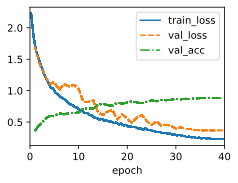

In [45]:
%%time
#Y1*(1-Y)
lr=1e-2   # (64, 64) channels
model = YingYangNet16(lr=lr, num_classes=10)
model.to(try_gpu())
trainer = d2l.Trainer(max_epochs=40, num_gpus=1, gradient_clip_val=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=512)


trainer.fit(model, data, 
            lr_update=0.1, lr_reduct_rule=-1, lr_limit = 1e-10, weight_decay=lr*1.56)

Accuracy: tensor(0.9332, device='cuda:0')
Learning rate: 4.0051464581572525e-08
Loss: tensor(0.0267, device='cuda:0')
Val loss, acc: tensor(0.2460, device='cuda:0') tensor(0.9332, device='cuda:0')
Lr: 0.01
Highest acc: 0.9332205653190613
CPU times: total: 40min 9s
Wall time: 1h 21min 24s


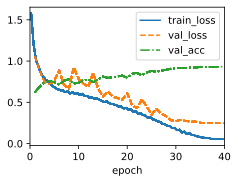

In [74]:
%%time
#Y1*(1-Y)
lr=1e-2   # (64, 64) channels
model = YingYangNet16(lr=lr, num_classes=10)
model.to(try_gpu())
trainer = d2l.Trainer(max_epochs=40, num_gpus=1, gradient_clip_val=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)


trainer.fit(model, data, 
            lr_update=0.1, lr_reduct_rule=-1, lr_limit = 1e-10, weight_decay=lr*1.56)

Accuracy: tensor(0.9191, device='cuda:0')
Learning rate: 4.0051464581572525e-08
Loss: tensor(0.0509, device='cuda:0')
Val loss, acc: tensor(0.2780, device='cuda:0') tensor(0.9191, device='cuda:0')
Lr: 0.01
Highest acc: 0.9190883636474609
CPU times: total: 32min 47s
Wall time: 1h 8min 14s


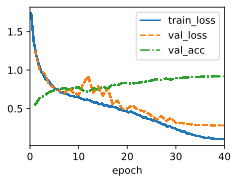

In [66]:
%%time
#Y1*(1-Y)
lr=1e-2
model = YingYangNet16(lr=lr, num_classes=10)
model.to(try_gpu())
trainer = d2l.Trainer(max_epochs=40, num_gpus=1, gradient_clip_val=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)


trainer.fit(model, data, 
            lr_update=0.1, lr_reduct_rule=-1, lr_limit = 1e-10, weight_decay=lr*1.56)

In [67]:
summary(model,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 32, 32]             320
       BatchNorm2d-2           [-1, 32, 32, 32]              64
              GELU-3           [-1, 32, 32, 32]               0
            Conv2d-4           [-1, 32, 32, 32]           9,248
       BatchNorm2d-5           [-1, 32, 32, 32]              64
            Conv2d-6           [-1, 32, 32, 32]              64
          Residual-7           [-1, 32, 32, 32]               0
       BatchNorm2d-8           [-1, 32, 32, 32]              64
            Conv2d-9          [-1, 128, 32, 32]           4,096
      BatchNorm2d-10          [-1, 128, 32, 32]             256
             GELU-11          [-1, 128, 32, 32]               0
           Conv2d-12          [-1, 128, 32, 32]           1,152
      BatchNorm2d-13          [-1, 128, 32, 32]             256
             GELU-14          [-1, 128,

Accuracy: tensor(0.8859, device='cuda:0')
Learning rate: 4.327694955059882e-08
Loss: tensor(0.1091, device='cuda:0')
Val loss, acc: tensor(0.3657, device='cuda:0') tensor(0.8859, device='cuda:0')
Lr: 0.01
CPU times: total: 9min 26s
Wall time: 35min 32s


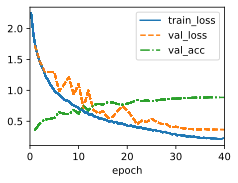

In [34]:
%%time
#Y1*(1-Y)
lr=1e-2
model = YingYangNet16(lr=lr, num_classes=10)
model.to(try_gpu())
trainer = d2l.Trainer(max_epochs=40, num_gpus=1, gradient_clip_val=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=512)


trainer.fit(model, data, 
            lr_update=0.1, lr_reduct_rule=-1, lr_limit = 1e-10, weight_decay=lr*1.56)

Accuracy: tensor(0.8834, device='cuda:0')
Learning rate: 4.327694955059882e-08
Loss: tensor(0.1086, device='cuda:0')
Val loss, acc: tensor(0.3736, device='cuda:0') tensor(0.8834, device='cuda:0')
Lr: 0.01
CPU times: total: 9min 47s
Wall time: 35min 33s


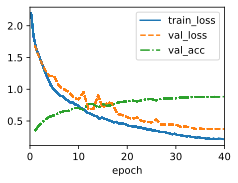

In [36]:
%%time
#Y1*(1-Y)
lr=1e-2
model = YingYangNet16(lr=lr, num_classes=10)
model.to(try_gpu())
trainer = d2l.Trainer(max_epochs=40, num_gpus=1, gradient_clip_val=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=512)


trainer.fit(model, data, 
            lr_update=0.1, lr_reduct_rule=-1, lr_limit = 1e-10, weight_decay=lr*1.56)

Accuracy: tensor(0.8754, device='cuda:0')
Learning rate: 4.327694955059882e-08
Val loss, acc: tensor(0.3859, device='cuda:0') tensor(0.8754, device='cuda:0')
Lr: 0.01
CPU times: total: 8min 54s
Wall time: 36min 23s


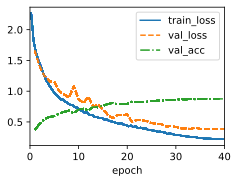

In [36]:
%%time
#Y1*Y +Y1 +Y
lr=1e-2
model = YingYangNet16(lr=lr, num_classes=10)
model.to(try_gpu())
trainer = d2l.Trainer(max_epochs=40, num_gpus=1, gradient_clip_val=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=512)


trainer.fit(model, data, 
            lr_update=0.1, lr_reduct_rule=-1, lr_limit = 1e-10, weight_decay=lr*1.56)

In [45]:
#summary(model,(3,32,32))

Accuracy: tensor(0.8946, device='cuda:0')
Learning rate: 4.0051464581572525e-08
Val loss, acc: tensor(0.3251, device='cuda:0') tensor(0.8946, device='cuda:0')
Lr: 0.01
CPU times: total: 1h 1min 3s
Wall time: 1h 9min 52s


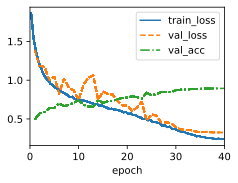

In [42]:
%%time
#Y1*(1-Y)+Y1-Y, batch_size=64
lr=1e-2
model = YingYangNet16(lr=lr, num_classes=10)
model.to(try_gpu())
trainer = d2l.Trainer(max_epochs=40, num_gpus=1, gradient_clip_val=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)


trainer.fit(model, data, 
            lr_update=0.1, lr_reduct_rule=-1, lr_limit = 1e-10, weight_decay=lr*1.56)

In [40]:
#  R  Y(1-Y1)  =  88%
#  Grey scale  =  88%

In [40]:
%%time
lr=1e-2
model = YingYangNet16(lr=lr, num_classes=10)
model.to(try_gpu())
summary(model,(3,32,32))

C:\Users\Augusto\anaconda3\envs\pytorch-fast\lib\site-packages\torch\nn\modules\lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 32, 32]             160
       BatchNorm2d-2           [-1, 16, 32, 32]              32
              GELU-3           [-1, 16, 32, 32]               0
            Conv2d-4           [-1, 16, 32, 32]           2,320
       BatchNorm2d-5           [-1, 16, 32, 32]              32
            Conv2d-6           [-1, 16, 32, 32]              32
          Residual-7           [-1, 16, 32, 32]               0
       BatchNorm2d-8           [-1, 16, 32, 32]              32
            Conv2d-9           [-1, 64, 32, 32]           1,024
      BatchNorm2d-10           [-1, 64, 32, 32]             128
             GELU-11           [-1, 64, 32, 32]               0
           Conv2d-12           [-1, 64, 32, 32]             576
      BatchNorm2d-13           [-1, 64, 32, 32]             128
             GELU-14           [-1, 64,

Accuracy: tensor(0.8919, device='cuda:0')
Learning rate: 4.0051464581572525e-08
Val loss, acc: tensor(0.3303, device='cuda:0') tensor(0.8919, device='cuda:0')
Lr: 0.01
CPU times: total: 1h 3min 48s
Wall time: 1h 15min 5s


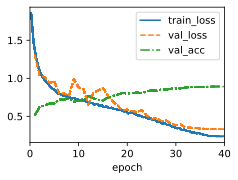

In [42]:
%%time
lr=1e-2
model = YingYangNet16(lr=lr, num_classes=10)
model.to(try_gpu())
trainer = d2l.Trainer(max_epochs=40, num_gpus=1, gradient_clip_val=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)


trainer.fit(model, data, 
            lr_update=0.1, lr_reduct_rule=-1, lr_limit = 1e-10, weight_decay=lr*1.56)

Accuracy: tensor(0.8947, device='cuda:0')
Learning rate: 4.0051464581572525e-08


TypeError: 'CIFAR10' object is not iterable

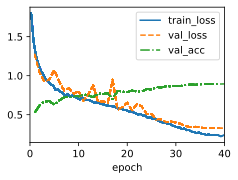

In [119]:
%%time
lr=1e-2
model = YingYangNet16(lr=lr, num_classes=10)
model.to(try_gpu())
trainer = d2l.Trainer(max_epochs=40, num_gpus=1, gradient_clip_val=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)


trainer.fit(model, data, 
            lr_update=0.1, lr_reduct_rule=-1, lr_limit = 1e-10, weight_decay=lr*1.56)

In [120]:
torch.save(model.state_dict(), 'mlp.params')

Accuracy: tensor(0.8921, device='cuda:0')
Learning rate: 4.0051464581572525e-08
Val loss, acc: tensor(0.3369, device='cuda:0') tensor(0.8921, device='cuda:0')
Lr: 0.01
CPU times: total: 53min 1s
Wall time: 1h 1min 57s


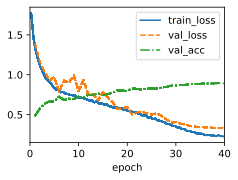

In [44]:
%%time
lr=1e-2
model = YingYangNet16(lr=lr, num_classes=10)
model.to(try_gpu())
trainer = d2l.Trainer(max_epochs=40, num_gpus=1, gradient_clip_val=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)


trainer.fit(model, data, 
            lr_update=0.1, lr_reduct_rule=-1, lr_limit = 1e-10, weight_decay=lr*1.56)

In [40]:
summary(model,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 32, 32]             160
       BatchNorm2d-2           [-1, 16, 32, 32]              32
            Conv2d-3           [-1, 16, 32, 32]           2,320
       BatchNorm2d-4           [-1, 16, 32, 32]              32
            Conv2d-5           [-1, 16, 32, 32]              32
          Residual-6           [-1, 16, 32, 32]               0
       BatchNorm2d-7           [-1, 16, 32, 32]              32
            Conv2d-8           [-1, 64, 32, 32]           1,024
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             GELU-10           [-1, 64, 32, 32]               0
           Conv2d-11           [-1, 64, 32, 32]             576
      BatchNorm2d-12           [-1, 64, 32, 32]             128
             GELU-13           [-1, 64, 32, 32]               0
          Dropout-14           [-1, 64,

Accuracy: tensor(0.8761, device='cuda:0')
Learning rate: 0.00030000000000000003
Val loss, acc: tensor(0.7908, device='cuda:0') tensor(0.8761, device='cuda:0')
Lr: 0.003
CPU times: total: 44min 55s
Wall time: 53min 20s


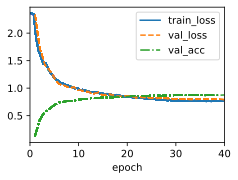

In [498]:
%%time
model = YingYangNet16(lr=3e-3, num_classes=10)
model.to(try_gpu())
trainer = d2l.Trainer(max_epochs=40, num_gpus=1, gradient_clip_val=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)


trainer.fit(model, data, 
            lr_update=0.1, lr_reduct_rule=0.001, lr_limit = 1e-10, weight_decay=1e-6, warmup=8)

Accuracy: tensor(0.8567, device='cuda:0')
Learning rate: 0.0003283432555816804
Val loss, acc: tensor(0.8263, device='cuda:0') tensor(0.8567, device='cuda:0')
Lr: 0.01
CPU times: total: 45min 47s
Wall time: 54min 17s


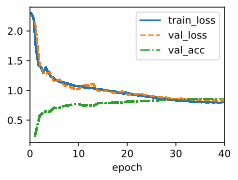

In [473]:
%%time
model = YingYangNet16(lr=1e-2, num_classes=10)
model.to(try_gpu())
trainer = d2l.Trainer(max_epochs=40, num_gpus=1, gradient_clip_val=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)


trainer.fit(model, data, 
            lr_update=0.1, lr_reduct_rule=0.001, lr_limit = 1e-10, weight_decay=1e-6)

Accuracy: tensor(0.8467, device='cuda:0')
Learning rate: 0.01
Val loss, acc: tensor(0.8476, device='cuda:0') tensor(0.8467, device='cuda:0')
Lr: 0.01
CPU times: total: 44min
Wall time: 52min 11s


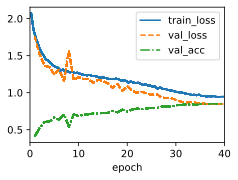

In [236]:
%%time
model = YingYangNet16(lr=1e-2, num_classes=10)
model.to(try_gpu())
trainer = d2l.Trainer(max_epochs=40, num_gpus=1, gradient_clip_val=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)


trainer.fit(model, data, 
            lr_update=0.1, lr_reduct_rule=0.001, lr_limit = 1e-10, weight_decay=1e-6)

Accuracy: tensor(0.8847, device='cuda:0')
Learning rate: 0.01
Val loss, acc: tensor(0.3512, device='cuda:0') tensor(0.8847, device='cuda:0')
Lr: 0.01
CPU times: total: 44min 3s
Wall time: 51min 43s


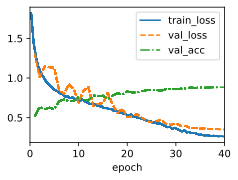

In [104]:
%%time
model = YingYangNet16(lr=1e-2, num_classes=10)
model.to(try_gpu())
trainer = d2l.Trainer(max_epochs=40, num_gpus=1, gradient_clip_val=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)


trainer.fit(model, data, 
            lr_update=0.1, lr_reduct_rule=0.001, lr_limit = 1e-10, weight_decay=1e-6)

In [105]:
summary(model,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 32, 32]             160
       BatchNorm2d-2           [-1, 16, 32, 32]              32
            Conv2d-3           [-1, 16, 32, 32]           2,320
       BatchNorm2d-4           [-1, 16, 32, 32]              32
            Conv2d-5           [-1, 16, 32, 32]              32
          Residual-6           [-1, 16, 32, 32]               0
       BatchNorm2d-7           [-1, 16, 32, 32]              32
            Conv2d-8           [-1, 64, 32, 32]           1,024
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             GELU-10           [-1, 64, 32, 32]               0
           Conv2d-11           [-1, 64, 32, 32]             576
      BatchNorm2d-12           [-1, 64, 32, 32]             128
             GELU-13           [-1, 64, 32, 32]               0
AdaptiveAvgPool2d-14             [-1, 6

<h1>Transformers MaxVIT Attempt</h1>

In [220]:
def make_tuple(x):
    if not isinstance(x, (list, tuple)):
        return (x, x)
    return x

In [ ]:
def Block(x,window_size):
    B,C,H,W = x.shape
    x = x.reshape(B,C,H//window_size[0],window_size[0],W//window_size[1],window_size[1])
    x = x.permute(0,2,4,1,3,5).contiguous()
    return x

#   (B, H//window_size, W//window_size, C, window_size, window_size)
def UnBlock(x):
    B,H,W,C,win_H,win_W = x.shape
    x = x.permute(0,3,1,4,2,5).contiguous().reshape(B,C,H*win_W,H*win_W)
    return x

In [221]:
class Channel_Layernorm(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.ln = nn.LayerNorm(dim)
        
    def forward(self, x):
        x = x.permute(0, 2, 3, 1).contiguous()
        x = self.ln(x)
        x = x.permute(0, 3, 1, 2).contiguous()
        return x

In [222]:
class Rel_Attention(nn.Module):
    def __init__(self, dim, window_size, num_heads, qkv_bias=True, qk_scale=None, attn_drop=0., proj_drop=0.):
        super().__init__()
        self.dim = dim
        self.win_h,self.win_w = window_size
        self.num_heads = num_heads
        head_dim = dim // num_heads
        self.scale = qk_scale or head_dim ** -0.5

        self.relative_bias_table = nn.Parameter(torch.zeros((2*self.win_h-1)*(2*self.win_w-1), num_heads))

        coords = torch.meshgrid((torch.arange(self.win_h), torch.arange(self.win_w)))
        coords = torch.flatten(torch.stack(coords), 1)
        relative_coords = coords[:, :, None] - coords[:, None, :]

        relative_coords[0] += self.win_h - 1
        relative_coords[1] += self.win_w - 1
        relative_coords[0] *= 2 * self.win_w - 1
        relative_coords = relative_coords.permute(1,2,0).contiguous()
        relative_index = relative_coords.sum(-1).flatten().unsqueeze(1)
        self.register_buffer("relative_index", relative_index)

        self.qkv = nn.Conv2d(dim,dim*3,1, bias=qkv_bias)
        self.proj = nn.Conv2d(dim, dim, 1)
        self.proj_drop = nn.Dropout(proj_drop)
        self.attn_drop = nn.Dropout(attn_drop)

    def forward(self, x):
        B,H,W,C,_,_ = x.shape
        N = self.win_h * self.win_w
        x = x.reshape(-1,C,self.win_h,self.win_w)

        relative_bias = self.relative_bias_table.gather(0, self.relative_index.repeat(1, self.num_heads))
        relative_bias = relative_bias.reshape(N,N,-1).permute(2,0,1).contiguous()
        
        q,k,v = self.qkv(x).chunk(3, dim=1)
        q = q.reshape([-1,C,N]).reshape(-1, self.num_heads, C // self.num_heads, N).permute(0,1,3,2).contiguous()
        k = k.reshape([-1,C,N]).reshape(-1, self.num_heads, C // self.num_heads, N).permute(0,1,3,2).contiguous()
        v = v.reshape([-1,C,N]).reshape(-1, self.num_heads, C // self.num_heads, N).permute(0,1,3,2).contiguous()

        attn = (q @ k.transpose(-2, -1).contiguous()) * self.scale
        attn = attn + relative_bias
        attn = attn.softmax(dim=-1)
        attn = self.attn_drop(attn)
        x = (attn @ v).transpose(2, 3).contiguous().reshape([-1,C,self.win_h,self.win_w])
        #x = self.proj(x)
        #x = self.proj_drop(x).reshape([B,H,W,C,self.win_h,self.win_w])
        x = self.proj(x).reshape([B,H,W,C,self.win_h,self.win_w])
        return x

In [223]:
#@save
class FFN(nn.Module):
    def __init__(self, in_features, hidden_features=None, act_layer=nn.SiLU, drop=0.):
        super().__init__()
        hidden_features = hidden_features
        self.fc1 = nn.Conv2d(in_features, hidden_features, 1)
        self.act = act_layer()
        self.fc2 = nn.Conv2d(hidden_features, in_features, 1)
        self.drop = nn.Dropout(drop)
        
    def forward(self, X):
        Y = self.fc1(X)
        Y = self.act(Y)
        
        #Y = self.drop(Y)
        
        Y = self.fc2(Y)
        Y = self.drop(Y)
        
        return F.gelu(X + Y)

In [224]:
class WindowBlock(nn.Module):
    def __init__(self, img_size, patch_size, num_hiddens, mlp_num_hiddens,
                 num_heads, depth, att_dropout, blk_dropout, use_bias = False):
        super().__init__()
        self.patch_size = make_tuple(patch_size)
        
        self.ln = Channel_Layernorm(num_hiddens)
        
        self.blks = nn.Sequential()
        for i in range(depth):
            self.blks.add_module(f"{i}", Rel_Attention(
                num_hiddens, self.patch_size,
                num_heads, use_bias, attn_drop=att_dropout))
            
        self.att_dropout = nn.Dropout(att_dropout)
        
        
        self.ffn = FFN(num_hiddens, num_hiddens*4, drop=blk_dropout)
        self.blk_dropout = nn.Dropout(blk_dropout)
        
    def forward(self, X):
        aux = Block(self.ln(X), self.patch_size)
        
        for blk in self.blks:
            aux = blk(aux)
        
        aux = UnBlock(aux)
        X = X + self.att_dropout(aux)
        
        aux = self.ffn(self.ln(X))
        X = X + self.blk_dropout(aux)
        return X

In [225]:
class GridBlock(nn.Module):
    def __init__(self, img_size, grid_size, num_hiddens, mlp_num_hiddens,
                 num_heads, depth, att_dropout, blk_dropout, use_bias = False):
        super().__init__()
        
        self.grid_size = make_tuple(grid_size)
        
        self.ln = Channel_Layernorm(num_hiddens)
        
        self.blks = nn.Sequential()
        for i in range(depth):
            self.blks.add_module(f"{i}", Rel_Attention(
                num_hiddens, self.grid_size,
                num_heads, use_bias, attn_drop=att_dropout))
            
        self.att_dropout = nn.Dropout(att_dropout)
        
        
        self.ffn = FFN(num_hiddens, num_hiddens*4, drop=blk_dropout)
        self.blk_dropout = nn.Dropout(blk_dropout)
        
    def forward(self, X):
        grid_size = (X.shape[2]//self.grid_size[0], X.shape[3]//self.grid_size[1])
        
        aux = Block(self.ln(X), grid_size)
        aux = aux.permute(0,4,5,3,1,2).contiguous()
        
        for blk in self.blks:
            aux = blk(aux)
        
        aux = UnBlock(aux)
        X = X + self.att_dropout(aux)
        
        aux = self.ffn(self.ln(X))
        X = X + self.blk_dropout(aux)
        
        return X

In [226]:
class MaxVitBlock(nn.Module):
    def __init__(self, img_size, grid_size, num_hiddens, mlp_num_hiddens,
                 num_heads, depth, att_dropout, blk_dropout, cnn_dropout, use_bias = False, mb_stride=1):
        super().__init__()
        self.mbconv = MBConv(num_hiddens, num_hiddens, dropout=cnn_dropout, stride_size=mb_stride)
        
        self.window_att = WindowBlock(img_size, grid_size, num_hiddens,
                                      mlp_num_hiddens, num_heads, depth,
                                      att_dropout, blk_dropout, use_bias)
        
        self.grid_att = GridBlock(img_size, grid_size, num_hiddens,
                                  mlp_num_hiddens, num_heads, depth,
                                  att_dropout, blk_dropout, use_bias)
        
        
    def ReductionBlock(self, num_channels, stride=2):
        return nn.Sequential(
                nn.LazyConv2d(num_channels, kernel_size=3, stride=stride, padding=1),
                nn.LazyBatchNorm2d(), nn.SiLU())        

    def forward(self, X):
    
        X = self.mbconv(X)
        X = self.window_att(X)
        X = self.grid_att(X)


        return X

In [227]:
class YingYangTransformer(d2l.Classifier):
    def __init__(self, img_size, patch_size, num_hiddens, mlp_num_hiddens,
                num_heads, yingyang_arch,
                depth, blk_dropout=0.1, att_dropout=0.1, dropout=0, cnn_dropout=0.1,
                lr=1e-2, use_bias=False, num_classes=10):
        super().__init__()
        self.save_hyperparameters()
        
        self.patch_size = make_tuple(patch_size)
        self.grid_size = self.patch_size
        
        
        #self.yingyang = YingYangBlock(*yingyang_arch)
        
       
        """
        self.ying = self.ying_stage(32, 4, yingyang_arch,
                                      mlp_num_hiddens, num_heads, depth,
                                      att_dropout, blk_dropout, use_bias)
        
        self.yang = self.yang_stage(16, 4, yingyang_arch,
                                      mlp_num_hiddens, num_heads, depth,
                                      att_dropout, blk_dropout, use_bias)
        """
        self.yingyang = YingYangBlock(*yingyang_arch)
        
        self.adjust_channel = Residual(num_hiddens, use_1x1conv=True)
        
        self.maxvit = MaxVitBlock(img_size, patch_size, num_hiddens,
                                      mlp_num_hiddens, num_heads, depth,
                                      att_dropout, blk_dropout, cnn_dropout, use_bias, mb_stride=1)
        
        self.reduction = nn.Sequential(MaxVitBlock(img_size//2, patch_size, num_hiddens,
                                          mlp_num_hiddens, num_heads, depth,
                                       att_dropout, blk_dropout, cnn_dropout, use_bias, mb_stride=2),
                                       MBConv(mlp_num_hiddens, mlp_num_hiddens, dropout=cnn_dropout),
                                       MBConv(mlp_num_hiddens, mlp_num_hiddens, dropout=cnn_dropout, stride_size=2))
        
        
        self.head = nn.Sequential(
                        nn.BatchNorm2d(num_hiddens),
                        nn.AdaptiveAvgPool2d((1,1)), nn.Flatten(),
                        nn.LazyLinear(num_hiddens*4),
                        nn.Tanh(),
                        nn.Dropout(p=dropout),
                        nn.LazyLinear(num_classes))
        
        self.yingyang.apply(d2l.init_cnn)
        #self.ying.apply(d2l.init_cnn)
        #self.yang.apply(d2l.init_cnn)
        self.adjust_channel.apply(d2l.init_cnn)
        self.maxvit.apply(d2l.init_cnn)
        self.reduction.apply(d2l.init_cnn)
        self.head.apply(d2l.init_cnn)
    
    def ying_stage(self, img_size, patch_size, yingyang_arch,
                        mlp_num_hiddens, num_heads, depth,
                        att_dropout, blk_dropout, use_bias):
        maxvit_depth, num_hiddens = yingyang_arch
        
        blk = [Residual(num_hiddens, use_1x1conv=True)]
        
        mb_stride=1
        for i in range(maxvit_depth):
            if i==maxvit_depth-1: mb_stride=2
            blk.append(MaxVitBlock(img_size, patch_size, num_hiddens,
                                      mlp_num_hiddens, num_heads, 1,
                                      att_dropout, blk_dropout, use_bias, mb_stride))

        
        return nn.Sequential(*blk)
        
    
    def yang_stage(self, img_size, patch_size, yingyang_arch,
                        mlp_num_hiddens, num_heads, depth,
                        att_dropout, blk_dropout, use_bias):
        
        maxvit_depth, num_hiddens = yingyang_arch
        
        blk = [Residual(num_hiddens, use_1x1conv=True)]
        
        mb_stride = 2
        for i in range(maxvit_depth):
            blk.append(MaxVitBlock(img_size, patch_size, num_hiddens,
                                      mlp_num_hiddens, num_heads, 1,
                                      att_dropout, blk_dropout, use_bias, mb_stride))
            mb_stride = 1
                       
        
        return nn.Sequential(*blk)
    

    
    def forward(self, X):
        #Y = self.ying(torch.unsqueeze(X[:, 0, :, :], 1))
            
        #Y1 = self.yang(X)
        
        #Y = torch.cat((Y, Y1), dim=1)        
        
        Y = self.yingyang(X)
        
        Y = self.adjust_channel(Y)
        #Y = self.yingyang(X)
        #Y = self.stem_blk(Y)
        
        Y = self.maxvit(Y)
        
        Y = self.reduction(Y)
        
        return self.head(Y)

KeyboardInterrupt: 

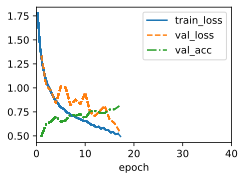

In [249]:
%%time

#AMSgrad, Adjusted Lr Wd
img_size, patch_size = 16, 4
num_hiddens, mlp_num_hiddens, num_heads, depth = 16, 16, 4, 1
att_dropout, blk_dropout, cnn_dropout, dropout = 0.1, 0.1, 0, 0
lr, num_classes = 1e-2, 10

yingyang_arch = (2, 16, cnn_dropout)

model = YingYangTransformer(img_size, patch_size, num_hiddens, mlp_num_hiddens, num_heads,
                            yingyang_arch, depth,
                            att_dropout, blk_dropout, dropout, cnn_dropout,
                            lr, num_classes)

model.to(try_gpu())

trainer = d2l.Trainer(max_epochs=40, num_gpus=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)

trainer.fit(model, data, 
            lr_update=0.2, lr_reduct_rule=-1, lr_limit = 1e-7, weight_decay=lr*1.56, warmup=8)

Accuracy: tensor(0.8809, device='cuda:0')
Learning rate: 0.0001875
Val loss, acc: tensor(0.3589, device='cuda:0') tensor(0.8809, device='cuda:0')
Lr: 0.003
CPU times: total: 58min 32s
Wall time: 1h 8min 46s


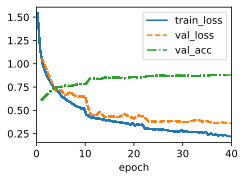

In [192]:
%%time

#Reduce on Plateau
img_size, patch_size = 16, 4
num_hiddens, mlp_num_hiddens, num_heads, depth = 16, 16, 4, 1
att_dropout, blk_dropout, cnn_dropout, dropout = 0.1, 0.1, 0, 0
lr, num_classes = 3e-3, 10

yingyang_arch = (2, 16, cnn_dropout)

model = YingYangTransformer(img_size, patch_size, num_hiddens, mlp_num_hiddens, num_heads,
                            yingyang_arch, depth,
                            att_dropout, blk_dropout, dropout, cnn_dropout,
                            lr, num_classes)

model.to(try_gpu())

trainer = d2l.Trainer(max_epochs=40, num_gpus=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)

trainer.fit(model, data, 
            lr_update=0.5, lr_reduct_rule=0.03, lr_limit = 1e-7, weight_decay=1e-4, warmup=8)

Accuracy: tensor(0.8947, device='cuda:0')
Learning rate: 0.01
Val loss, acc: tensor(0.3204, device='cuda:0') tensor(0.8947, device='cuda:0')
Lr: 0.01


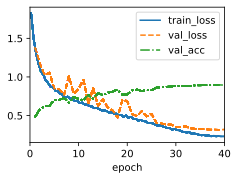

In [117]:
#Stochastic Depth: 79k
img_size, patch_size = 16, 4
num_hiddens, mlp_num_hiddens, num_heads, depth = 16, 16, 4, 1
att_dropout, blk_dropout, cnn_dropout, dropout = 0.1, 0.1, 0.1, 0
lr, num_classes = 1e-2, 10

yingyang_arch = (3, 16, cnn_dropout)

model = YingYangTransformer(img_size, patch_size, num_hiddens, mlp_num_hiddens, num_heads,
                            yingyang_arch, depth,
                            att_dropout, blk_dropout, dropout, cnn_dropout,
                            lr, num_classes)

model.to(try_gpu())

trainer = d2l.Trainer(max_epochs=40, num_gpus=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)

trainer.fit(model, data, 
            lr_update=0.5, lr_reduct_rule=0.001, lr_limit = 0.001, weight_decay=0.0001)

In [119]:
#summary(model,(3,32,32))

In [ ]:
#One Cycle R
img_size, patch_size = 16, 4
num_hiddens, mlp_num_hiddens, num_heads, depth = 16, 16, 4, 1
att_dropout, blk_dropout, dropout, cnn_dropout = 0.1, 0.1, 0, 0.1
lr, num_classes = 1e-2, 10

yingyang_arch = (3, 16)

model = YingYangTransformer(img_size, patch_size, num_hiddens, mlp_num_hiddens, num_heads,
                            yingyang_arch, depth,
                            att_dropout, blk_dropout, dropout, cnn_dropout,
                            lr, num_classes)

model.to(try_gpu())

trainer = d2l.Trainer(max_epochs=40, num_gpus=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)

trainer.fit(model, data, 
            lr_update=0.5, lr_reduct_rule=0.001, lr_limit = 0.001, weight_decay=0.0001)

NameError: name 'YingYangTransformer' is not defined

Accuracy: tensor(0.8590, device='cuda:0')
Learning rate: 0.01
Val loss, acc: tensor(0.4172, device='cuda:0') tensor(0.8590, device='cuda:0')
Lr: 0.01


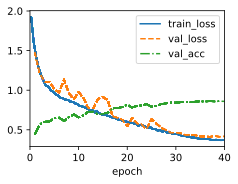

In [51]:
#One Cycle R
img_size, patch_size = 16, 4
num_hiddens, mlp_num_hiddens, num_heads, depth = 16, 16, 4, 1
att_dropout, blk_dropout, lr = 0.2, 0.2, 0.01

yingyang_arch = (2, 16)

model = YingYangTransformer(img_size, patch_size, num_hiddens, mlp_num_hiddens, num_heads,
        depth, att_dropout, blk_dropout, yingyang_arch, lr)

trainer = d2l.Trainer(max_epochs=40, num_gpus=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)

trainer.fit(model, data, 
            lr_update=0.5, lr_reduct_rule=0.001, lr_limit = 0.001, weight_decay=0.0001)

In [ ]:
summary(model,(3,32,32))

Accuracy: tensor(0.8685, device='cuda:0')
Val loss, acc: tensor(0.3804, device='cuda:0') tensor(0.8685, device='cuda:0')
Lr: 0.01


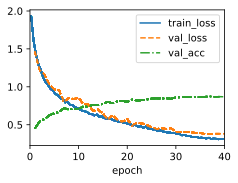

In [56]:
#One Cycle R
img_size, patch_size = 16, 4
num_hiddens, mlp_num_hiddens, num_heads, depth = 16, 16, 4, 1
att_dropout, blk_dropout, lr = 0., 0., 0.01

yingyang_arch = (2, 16)

model = YingYangTransformer(img_size, patch_size, num_hiddens, mlp_num_hiddens, num_heads,
        depth, att_dropout, blk_dropout, yingyang_arch, lr)

trainer = d2l.Trainer(max_epochs=40, num_gpus=1)
data = d2l.CIFAR10(train_tfms, val_tfms, batch_size=64)

trainer.fit(model, data, 
            lr_update=0.5, lr_reduct_rule=0.001, lr_limit = 0.001, weight_decay=0.0001)

In [60]:
summary(model,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 32, 32]              32
       BatchNorm2d-2           [-1, 16, 32, 32]              32
              GELU-3           [-1, 16, 32, 32]               0
       BatchNorm2d-4           [-1, 16, 32, 32]              32
            Conv2d-5           [-1, 64, 32, 32]           1,024
       BatchNorm2d-6           [-1, 64, 32, 32]             128
              GELU-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]             576
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             GELU-10           [-1, 64, 32, 32]               0
           Conv2d-11              [-1, 4, 1, 1]             256
             GELU-12              [-1, 4, 1, 1]               0
           Conv2d-13             [-1, 64, 1, 1]             256
          Sigmoid-14             [-1, 6